# Anomaly detection for Dispatch cold room

In [1]:
# import libraries
import sys
import numpy as np
import pandas as pd
from sqlalchemy import create_engine
from tensorflow import keras
from tensorflow.keras import layers
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

#config plots
%matplotlib inline
sns.set(rc={"figure.figsize": (26, 10)})

In [2]:
# load custom functions
sys.path.append("../")
from cnrdlib import cl_eda as cle

In [3]:
# load 5-min data from data-etl
engine = create_engine(f"sqlite:///../data/RawData.db")
df_all = pd.read_sql_table("SensorData_5min", con=engine, index_col="timestamp")
df_all.head()

,WIP_temp,DP_temp,Ext_temp,WIP_current,DP_current
timestamp,,,,,
2021-03-30 00:00:00,4.828750,3.028125,17.063750,5.881250,9.741250
2021-03-30 00:05:00,4.299444,3.080000,17.474444,6.122778,9.839444
2021-03-30 00:10:00,4.506471,2.900588,17.605882,5.895000,9.783750
2021-03-30 00:15:00,4.075000,3.020000,17.395000,5.597059,9.704118
2021-03-30 00:20:00,4.044118,3.010000,17.536471,5.254118,8.987647


In [4]:
df_all.columns

Index(['WIP_temp', 'DP_temp', 'Ext_temp', 'WIP_current', 'DP_current'], dtype='object')

In [5]:
# keep only cold room temperature column
df = df_all.drop(['WIP_temp', 'Ext_temp', 'WIP_current', 'DP_current'], axis=1)
df.head()

,DP_temp
timestamp,
2021-03-30 00:00:00,3.028125
2021-03-30 00:05:00,3.080000
2021-03-30 00:10:00,2.900588
2021-03-30 00:15:00,3.020000
2021-03-30 00:20:00,3.010000


In [6]:
cle.plot_timeseries_plotly(df, ["DP_temp"])

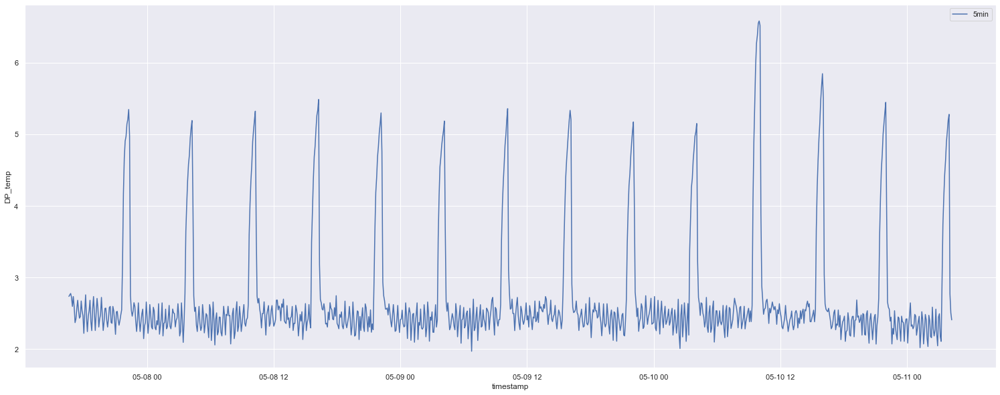

In [91]:
# select time period to find a "normal" patterns
# filter_5min = (df.index > '2021-05-15') & (df.index < '2021-05-16')
filter_5min = (df.index > '2021-05-07 16:30') & (df.index < '2021-05-11 4:20')
sns.lineplot(x=df.index[filter_5min], y="DP_temp", data=df[filter_5min], label="5min");

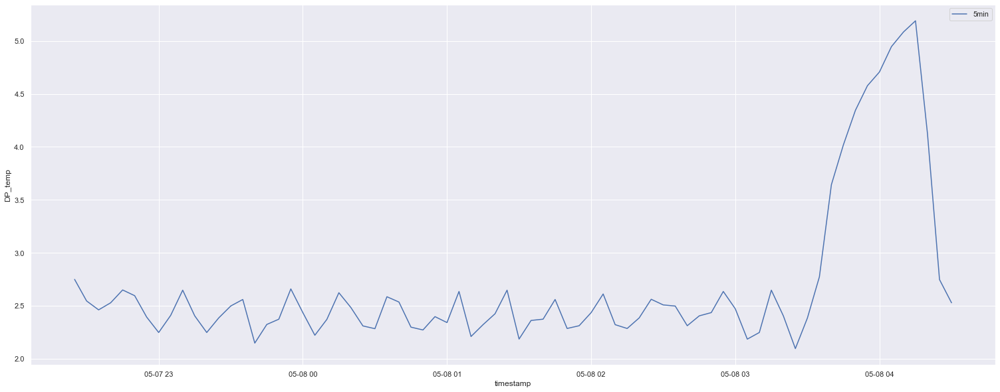

In [92]:
filter_cycle = (df.index > '2021-05-07 22:20') & (df.index < '2021-05-08 4:35')
sns.lineplot(x=df.index[filter_cycle], y="DP_temp", data=df[filter_cycle], label="5min");

In [93]:
len(df[filter_cycle])
#59

74

In [94]:
# Normalize and save the mean and std we get,
# for normalizing test data.
df_train = df[filter_5min]
training_mean = df_train.mean()
training_std = df_train.std()
df_training_value = (df_train - training_mean) / training_std
print("Number of training samples:", len(df_training_value))

Number of training samples: 1005


In [101]:
TIME_STEPS = 76

# Generated training sequences for use in the model.
def create_sequences(values, time_steps=TIME_STEPS):
    output = []
    for i in range(len(values) - time_steps + 1):
        output.append(values[i : (i + time_steps)])
        print(f"{i} : {i + time_steps}")
    return np.stack(output)


x_train = create_sequences(df_training_value.values)
print("Training input shape: ", x_train.shape)

0 : 76
1 : 77
2 : 78
3 : 79
4 : 80
5 : 81
6 : 82
7 : 83
8 : 84
9 : 85
10 : 86
11 : 87
12 : 88
13 : 89
14 : 90
15 : 91
16 : 92
17 : 93
18 : 94
19 : 95
20 : 96
21 : 97
22 : 98
23 : 99
24 : 100
25 : 101
26 : 102
27 : 103
28 : 104
29 : 105
30 : 106
31 : 107
32 : 108
33 : 109
34 : 110
35 : 111
36 : 112
37 : 113
38 : 114
39 : 115
40 : 116
41 : 117
42 : 118
43 : 119
44 : 120
45 : 121
46 : 122
47 : 123
48 : 124
49 : 125
50 : 126
51 : 127
52 : 128
53 : 129
54 : 130
55 : 131
56 : 132
57 : 133
58 : 134
59 : 135
60 : 136
61 : 137
62 : 138
63 : 139
64 : 140
65 : 141
66 : 142
67 : 143
68 : 144
69 : 145
70 : 146
71 : 147
72 : 148
73 : 149
74 : 150
75 : 151
76 : 152
77 : 153
78 : 154
79 : 155
80 : 156
81 : 157
82 : 158
83 : 159
84 : 160
85 : 161
86 : 162
87 : 163
88 : 164
89 : 165
90 : 166
91 : 167
92 : 168
93 : 169
94 : 170
95 : 171
96 : 172
97 : 173
98 : 174
99 : 175
100 : 176
101 : 177
102 : 178
103 : 179
104 : 180
105 : 181
106 : 182
107 : 183
108 : 184
109 : 185
110 : 186
111 : 187
112 : 188
113 

In [138]:
model = keras.Sequential(
    [
        layers.Input(shape=(x_train.shape[1], x_train.shape[2])),
        layers.Conv1D(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1D(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(
            filters=16, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Dropout(rate=0.2),
        layers.Conv1DTranspose(
            filters=32, kernel_size=7, padding="same", strides=2, activation="relu"
        ),
        layers.Conv1DTranspose(filters=1, kernel_size=7, padding="same"),
    ]
)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss="mse")
model.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_34 (Conv1D)           (None, 38, 32)            256       
_________________________________________________________________
dropout_34 (Dropout)         (None, 38, 32)            0         
_________________________________________________________________
conv1d_35 (Conv1D)           (None, 19, 16)            3600      
_________________________________________________________________
conv1d_transpose_51 (Conv1DT (None, 38, 16)            1808      
_________________________________________________________________
dropout_35 (Dropout)         (None, 38, 16)            0         
_________________________________________________________________
conv1d_transpose_52 (Conv1DT (None, 76, 32)            3616      
_________________________________________________________________
conv1d_transpose_53 (Conv1DT (None, 76, 1)           

In [139]:
history = model.fit(
    x_train,
    x_train,
    epochs=100,
    batch_size=128,
    validation_split=0.1,
    callbacks=[
        keras.callbacks.EarlyStopping(monitor="val_loss", patience=5, mode="min")
    ],
)

Epoch 1/100
7/7 [==============================] - 1s 35ms/step - loss: 0.9584 - val_loss: 0.9436
Epoch 2/100
7/7 [==============================] - 0s 16ms/step - loss: 0.7515 - val_loss: 0.6394
Epoch 3/100
7/7 [==============================] - 0s 18ms/step - loss: 0.4433 - val_loss: 0.3811
Epoch 4/100
7/7 [==============================] - 0s 16ms/step - loss: 0.2549 - val_loss: 0.2021
Epoch 5/100
7/7 [==============================] - 0s 18ms/step - loss: 0.1646 - val_loss: 0.1426
Epoch 6/100
7/7 [==============================] - 0s 16ms/step - loss: 0.1577 - val_loss: 0.1345
Epoch 7/100
7/7 [==============================] - 0s 17ms/step - loss: 0.1392 - val_loss: 0.1362
Epoch 8/100
7/7 [==============================] - 0s 16ms/step - loss: 0.1316 - val_loss: 0.1308
Epoch 9/100
7/7 [==============================] - 0s 16ms/step - loss: 0.1264 - val_loss: 0.1141
Epoch 10/100
7/7 [==============================] - 0s 16ms/step - loss: 0.1186 - val_loss: 0.1071
Epoch 11/100
7/7 [=

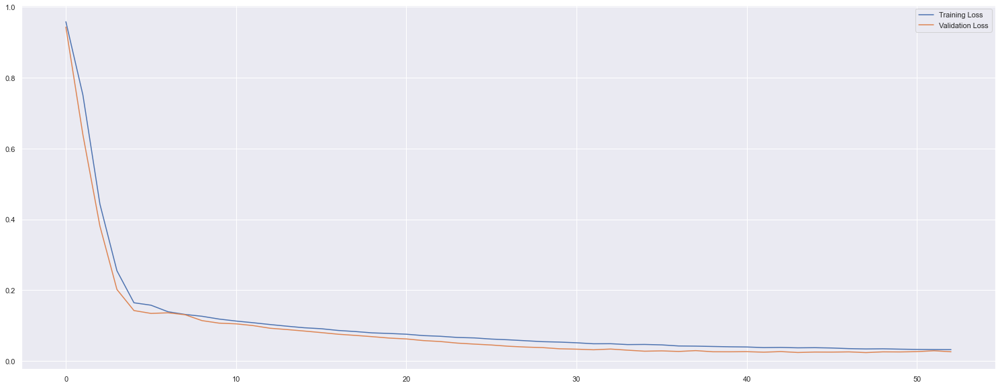

In [140]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()

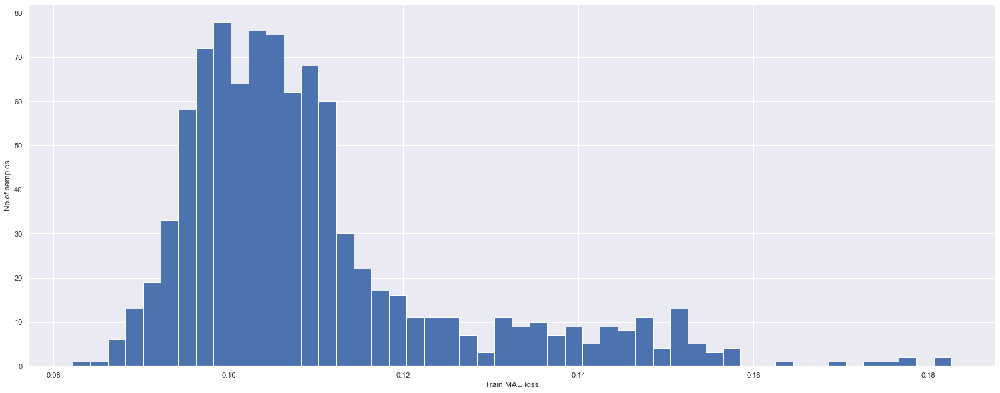

Reconstruction error threshold:  0.20088193236458565


In [147]:
# Get train MAE loss.
x_train_pred = model.predict(x_train)
train_mae_loss = np.mean(np.abs(x_train_pred - x_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel("Train MAE loss")
plt.ylabel("No of samples")
plt.show()

# Get reconstruction loss threshold.
threshold = np.max(train_mae_loss)*1.1
print("Reconstruction error threshold: ", threshold)

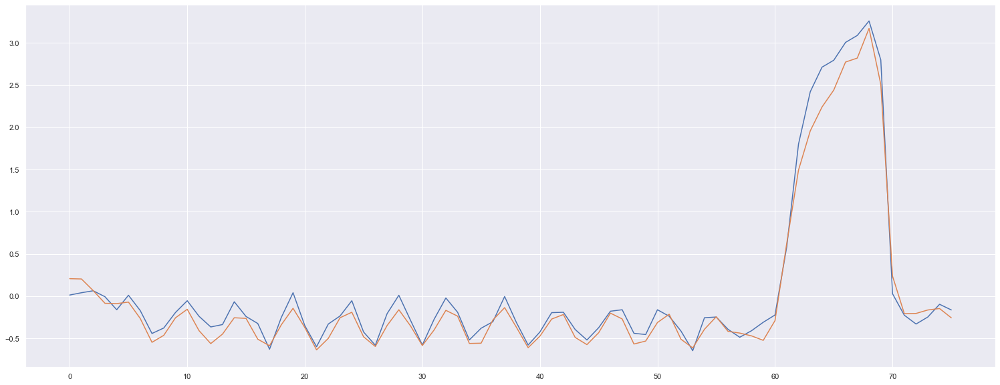

In [148]:
# Checking how the first sequence is learnt
plt.plot(x_train[0])
plt.plot(x_train_pred[0])
plt.show()

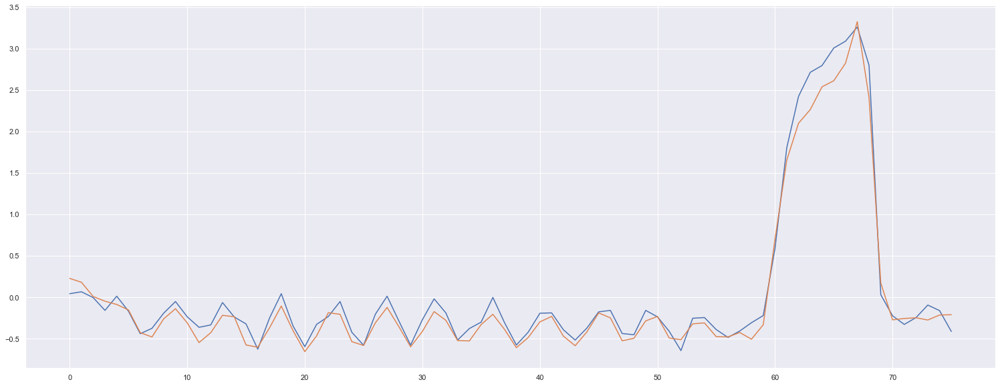

In [143]:
# Checking how the first sequence is learnt
plt.plot(x_train[1])
plt.plot(x_train_pred[1])
plt.show()

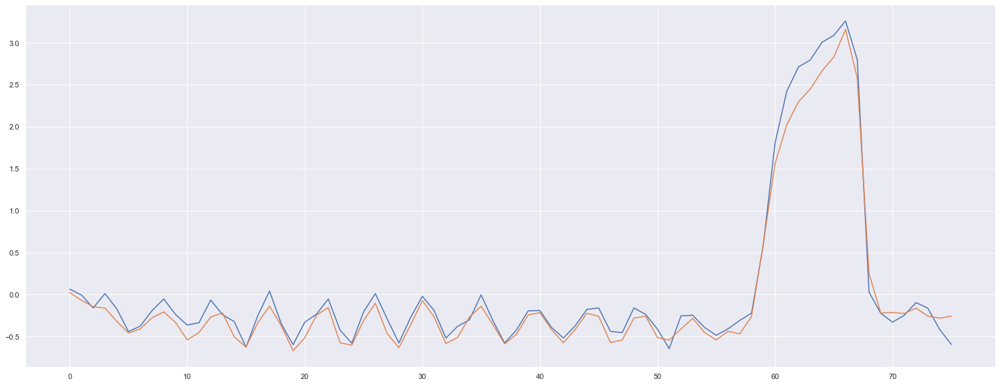

In [144]:
# Checking how the first sequence is learnt
plt.plot(x_train[2])
plt.plot(x_train_pred[2])
plt.show()

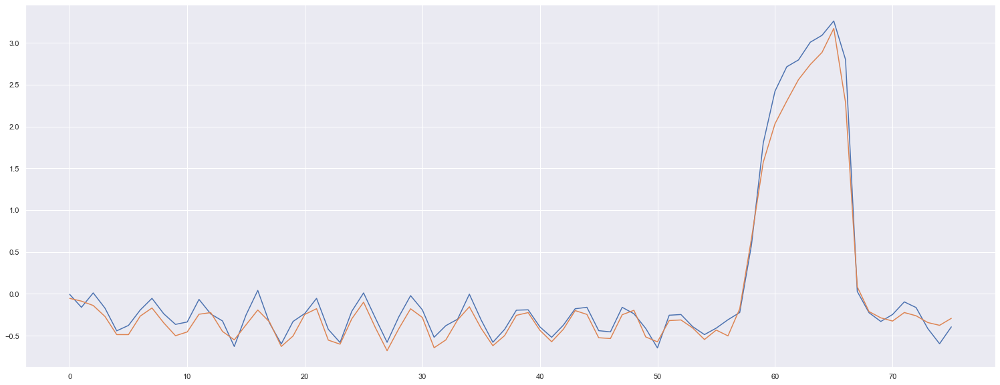

In [145]:
# Checking how the first sequence is learnt
plt.plot(x_train[3])
plt.plot(x_train_pred[3])
plt.show()

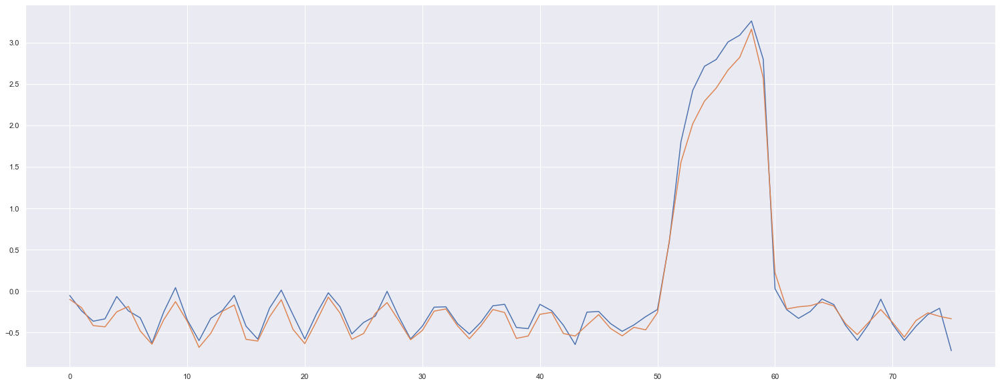

In [146]:
# Checking how the first sequence is learnt
plt.plot(x_train[10])
plt.plot(x_train_pred[10])
plt.show()

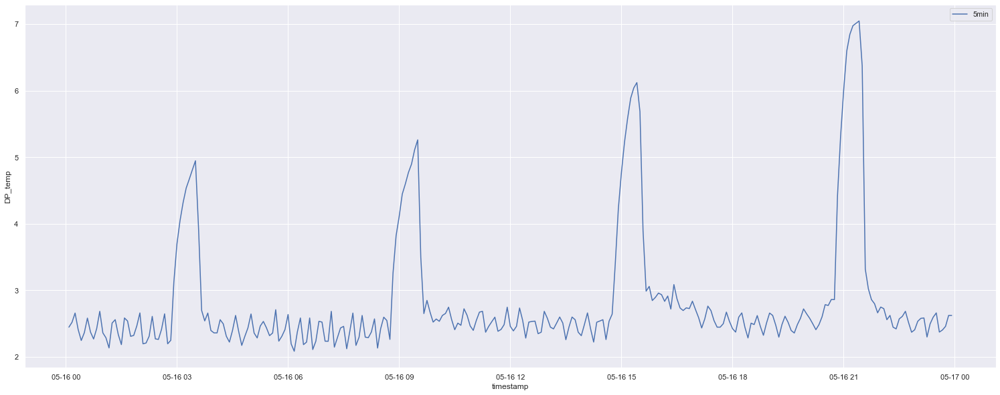

In [40]:
filter_anomaly = (df.index > '2021-05-16') & (df.index < '2021-05-17')
sns.lineplot(x=df.index[filter_anomaly], y="DP_temp", data=df[filter_anomaly], label="5min");

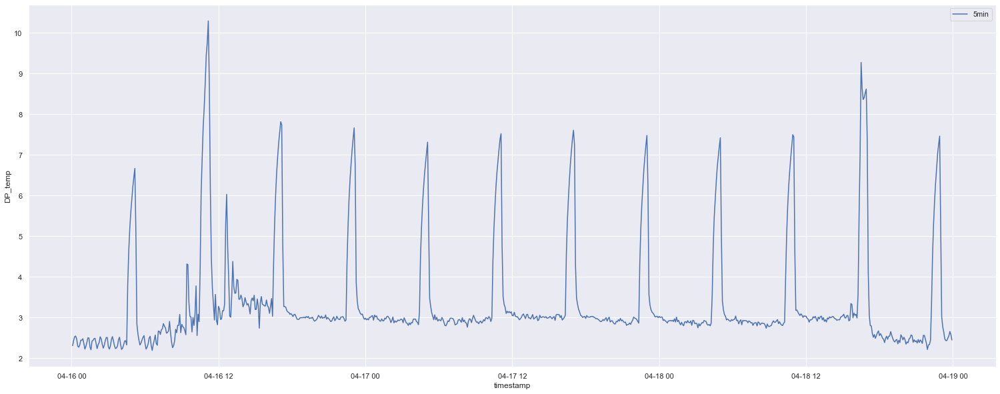

In [41]:
filter_anomaly = (df.index > '2021-04-16') & (df.index < '2021-04-19')
sns.lineplot(x=df.index[filter_anomaly], y="DP_temp", data=df[filter_anomaly], label="5min");

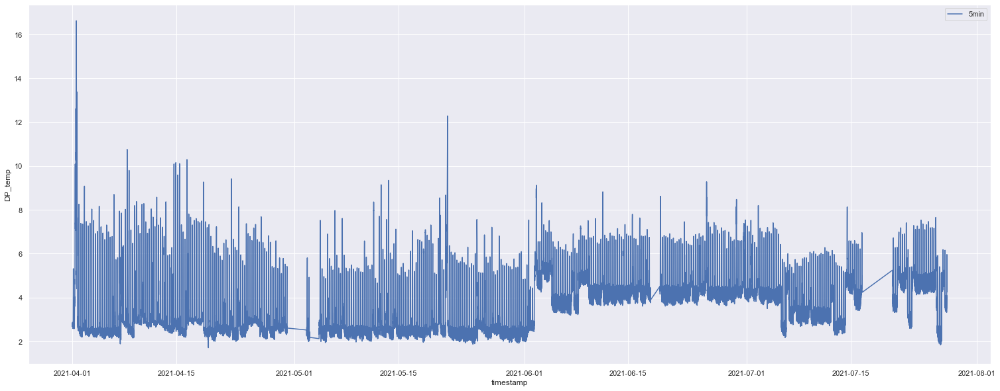

In [42]:
filter_anomaly = (df.index > '2021-04-01') & (df.index < '2021-07-30')
sns.lineplot(x=df.index[filter_anomaly], y="DP_temp", data=df[filter_anomaly], label="5min");

In [43]:
df_anomaly = df[filter_anomaly]
df_anomaly.head()

,DP_temp
timestamp,
2021-04-01 00:05:00,2.715882
2021-04-01 00:10:00,2.687778
2021-04-01 00:15:00,2.716471
2021-04-01 00:20:00,2.805294
2021-04-01 00:25:00,2.857222


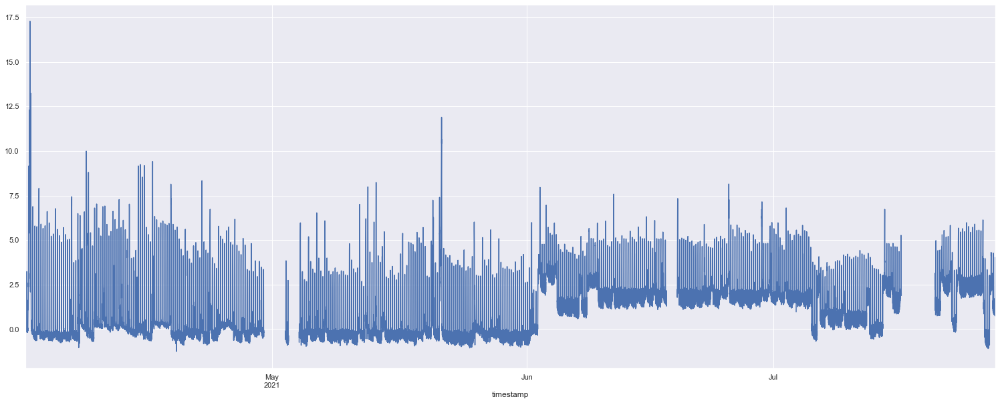

0 : 76
1 : 77
2 : 78
3 : 79
4 : 80
5 : 81
6 : 82
7 : 83
8 : 84
9 : 85
10 : 86
11 : 87
12 : 88
13 : 89
14 : 90
15 : 91
16 : 92
17 : 93
18 : 94
19 : 95
20 : 96
21 : 97
22 : 98
23 : 99
24 : 100
25 : 101
26 : 102
27 : 103
28 : 104
29 : 105
30 : 106
31 : 107
32 : 108
33 : 109
34 : 110
35 : 111
36 : 112
37 : 113
38 : 114
39 : 115
40 : 116
41 : 117
42 : 118
43 : 119
44 : 120
45 : 121
46 : 122
47 : 123
48 : 124
49 : 125
50 : 126
51 : 127
52 : 128
53 : 129
54 : 130
55 : 131
56 : 132
57 : 133
58 : 134
59 : 135
60 : 136
61 : 137
62 : 138
63 : 139
64 : 140
65 : 141
66 : 142
67 : 143
68 : 144
69 : 145
70 : 146
71 : 147
72 : 148
73 : 149
74 : 150
75 : 151
76 : 152
77 : 153
78 : 154
79 : 155
80 : 156
81 : 157
82 : 158
83 : 159
84 : 160
85 : 161
86 : 162
87 : 163
88 : 164
89 : 165
90 : 166
91 : 167
92 : 168
93 : 169
94 : 170
95 : 171
96 : 172
97 : 173
98 : 174
99 : 175
100 : 176
101 : 177
102 : 178
103 : 179
104 : 180
105 : 181
106 : 182
107 : 183
108 : 184
109 : 185
110 : 186
111 : 187
112 : 188
113 

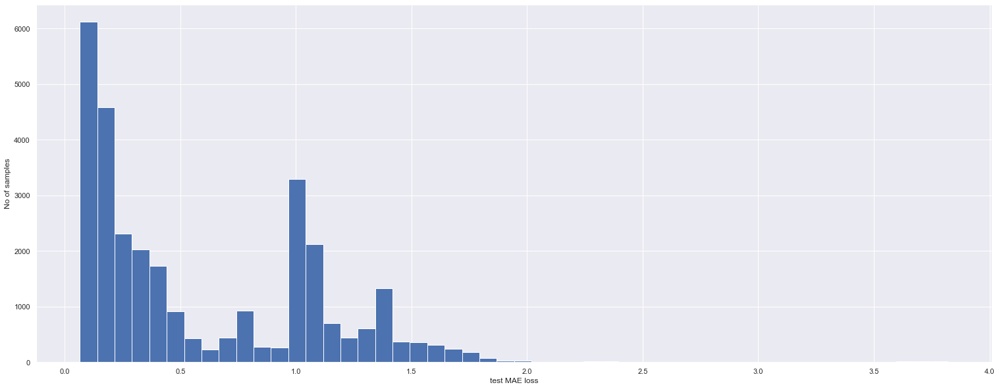

Number of anomaly samples:  20458


In [149]:
df_test_value = (df_anomaly - training_mean) / training_std
fig, ax = plt.subplots()
df_test_value.plot(legend=False, ax=ax)
plt.show()

# Create sequences from test values.
x_test = create_sequences(df_test_value.values)
print("Test input shape: ", x_test.shape)

# Get test MAE loss.
x_test_pred = model.predict(x_test)
test_mae_loss = np.mean(np.abs(x_test_pred - x_test), axis=1)
test_mae_loss = test_mae_loss.reshape((-1))

plt.hist(test_mae_loss, bins=50)
plt.xlabel("test MAE loss")
plt.ylabel("No of samples")
plt.show()

# Detect all the samples which are anomalies.
anomalies = test_mae_loss > threshold
print("Number of anomaly samples: ", np.sum(anomalies))
# print("Indices of anomaly samples: ", np.where(anomalies))

In [150]:
# data i is an anomaly if samples [(i - timesteps + 1) to (i)] are anomalies
anomalous_data_indices = []
for data_idx in range(TIME_STEPS - 1, len(df_test_value) - TIME_STEPS + 1):
    if np.all(anomalies[data_idx - TIME_STEPS + 1 : data_idx]):
        anomalous_data_indices.append(data_idx)

In [151]:
df_subset = df_anomaly.iloc[anomalous_data_indices]
df_subset.shape

(16986, 1)

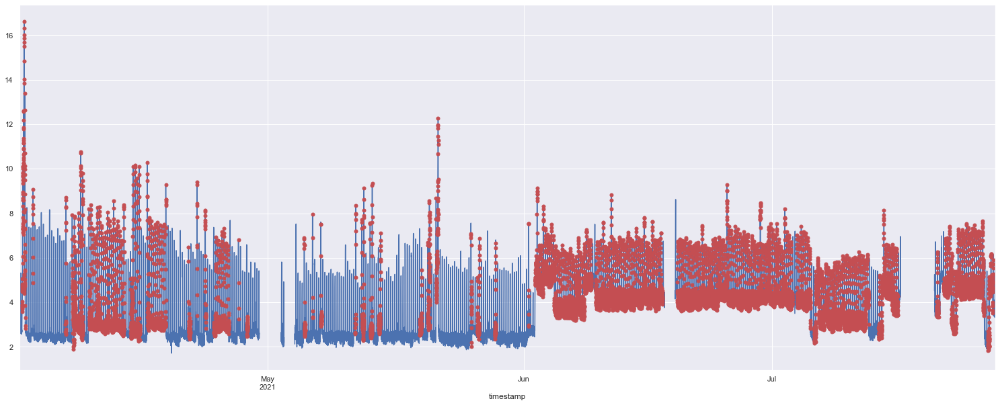

In [152]:
fig, ax = plt.subplots()
df_anomaly.plot(legend=False, ax=ax)
df_subset.plot(legend=False, ax=ax, color="r", marker="o", markersize=5, linewidth=0)
plt.show()

In [153]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_anomaly.index, y=df_anomaly.DP_temp, mode='lines', name='trend'))
fig.add_trace(go.Scatter(x=df_subset.index, y=df_subset.DP_temp, mode='markers', name='anomalies'))
fig.show()